In [1]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
import matplotlib.pyplot as plt
import my_alg
%matplotlib inline

In [2]:
# define loss function: could also try other loss function like mae ssim
def ave_cross_en( y_true, y_pred):
    loss = ( keras.losses.kullback_leibler_divergence( y_true, y_pred) +  keras.losses.kld( 1 - y_true, 1- y_pred))
    return loss

In [23]:
# load dataset
mnist_x = np.load('/Users/shunjiezhang/Desktop/class_Unet/ref_imgs_128_view_coloremnist_test_1000_202001024.npy')
mnist_b = np.load('/Users/shunjiezhang/Desktop/class_Unet/ccm_imgs_128_view_coloremnist_test_1000_202001024.npy')


In [24]:
# check shape of dataset
mnist_x.shape, mnist_b.shape

((1000, 128, 128, 3), (1000, 128, 128, 3))

In [10]:
# expand dimension of dataset to fit model
mnist_b = np.expand_dims( mnist_b, axis=3)
mnist_x = np.expand_dims( mnist_x, axis=3)

In [11]:
mnist_x.shape, mnist_b.shape

((9982, 128, 128, 1), (9982, 128, 128, 1))

In [25]:
# define random function to seprate dataset into train data, eval data and test data, randomly
np.random.seed(47)
arg_random = np.random.permutation( len( mnist_b))

In [26]:
# seprate dataset into train data, eval data and test data, randomly
NUM_TRAIN = int( 0.9 * len( mnist_x))
x_train = mnist_x[ arg_random[:NUM_TRAIN-100]]
b_train = mnist_b[arg_random[:NUM_TRAIN-100]]

x_eval = mnist_x[ arg_random[NUM_TRAIN-100:NUM_TRAIN]]
b_eval = mnist_b[ arg_random[NUM_TRAIN-100:NUM_TRAIN]]

x_test = mnist_x[ arg_random[NUM_TRAIN:]]
b_test = mnist_b[ arg_random[NUM_TRAIN:]]


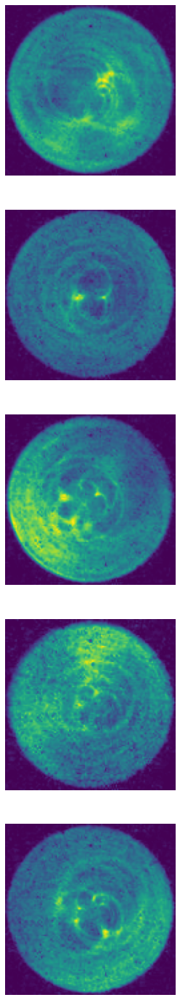

In [17]:
fig = my_alg.show_random_sampels( b_train,5,1,idx = range(5))

In [40]:
# define model and compile it: learning rate is adjustable
# this is for gray scale images
model = my_alg.build_model_128()
model.compile(optimizer=keras.optimizers.Adam(1e-3, amsgrad= True), loss=ave_cross_en, metrics=['mae'])

In [38]:
# define model and compile it: learning rate is adjustable
#this is for color image
model = my_alg.build_model_128_color()
model.compile(optimizer=keras.optimizers.Adam(1e-3, amsgrad= True), loss=ave_cross_en, metrics=['mae'])

In [41]:
# train model: set batch_size and epochs
model.fit(b_train, x_train, batch_size=16, epochs=2, verbose=1,validation_data= ( b_eval, x_eval))

Train on 800 samples, validate on 100 samples
Epoch 1/2
800/800 [==============================] - 48s 60ms/sample - loss: 1.5750 - mean_absolute_error: 0.3900 - val_loss: 0.9063 - val_mean_absolute_error: 0.2642
Epoch 2/2
800/800 [==============================] - 45s 56ms/sample - loss: 0.6043 - mean_absolute_error: 0.1682 - val_loss: 0.5860 - val_mean_absolute_error: 0.1589


In [42]:
# predict train data
train_pred = model.predict( b_train)

In [43]:
train_pred.shape

(800, 128, 128, 3)

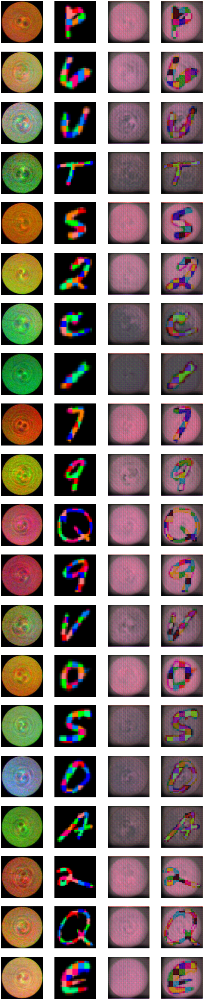

In [44]:
train_fig = my_alg.show_some_results( b_train, x_train, train_pred,20)

In [20]:
# predict test data
test_pred = model.predict( b_test)

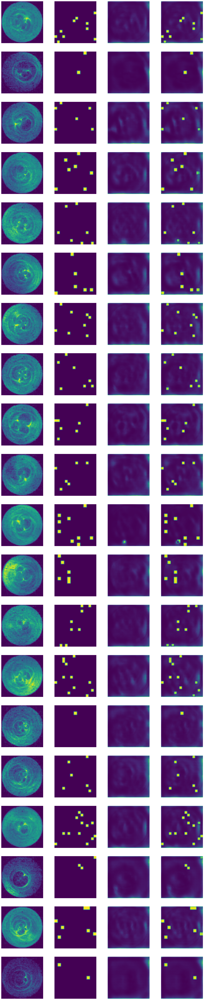

In [21]:
test_fig = my_alg.show_some_results( b_test, x_test, test_pred,20, img_size=5)